# How to process single cell RNA-seq data with Python

Welcome to this course.
Today we will learn how to process aligned single cell data (from 10X CellRanger) and work with them

A bit of context:

The most common format used in Python for processing single cell data is anndata format. anndata is a format developed to store matrix like data (e.g., count matrices) but with extra layer of information, like metadata or dimensionality reduction results.
This format convinently stores all this information in a single object that is multi faceted (i.e., contains multiple other objects like pandas dataframes).
Here for more details on anndata (https://anndata.readthedocs.io/en/latest/index.html)

But today we will not indulge too much on understand the data format itself, but i will try to guide you through the use of these data format and how to exploit its power.

This code is strongly based on this guide ([SC ANALYSIS BEST PRACTICE GUIDE](https://www.sc-best-practices.org/preamble.html)).
I consider it an important starting point and 'i forget how to do this' type of guide, so use it any time you need it. It's well maintained and updated and very well explained in general.

# IMPORT

In [110]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import decoupler as dcp

In [111]:
sc.__version__, dcp.__version__, pd.__version__, np.__version__, sns.__version__, plt.matplotlib.__version__

('1.10.3', '1.8.0', '2.2.3', '1.26.4', '0.13.2', '3.9.3')

In [112]:
plt.rcdefaults()
sns.reset_defaults()
sns.set_theme(style="white", context="notebook", font_scale=1.2, rc={"figure.figsize":(7,4),"image.cmap":'coolwarm'}, palette="deep")

# LET'S OPEN A 10X MATRIX

In [113]:
WP="/home/scancellieri/scanpy_workshop"

The default format you will get from a 10x cellranger alignment will be mtx (a set of files with expression counts, cellbarcodes and gene names) or a compressed version of an annotated matrix (i.e., a h5 file with rownames and colnames (barcodesXgenes))

We will work with two samples from a public dataset of PDAC (pancreatic cancer) with treated and untreated cells.

The pipeline will start with reading the h5 files and then we will clean them before merging in a single dataset.

In [114]:
adata_1_raw = sc.read_10x_h5(f"{WP}/T10_filtered.h5")
print(adata_1_raw)
adata_2_raw = sc.read_10x_h5(f"{WP}/U11_filtered.h5")
print(adata_2_raw)

/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3544 × 36601
    var: 'gene_ids', 'feature_types', 'genome'
AnnData object with n_obs × n_vars = 6689 × 36601
    var: 'gene_ids', 'feature_types', 'genome'


/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1756: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


# QC AND FILTER THE SINGLE SAMPLE DATASET

Function to clean every single sample treated as a single experiment.
This is a standard procedure due to the high heterogeneity of single cell experiments.
This function contains common steps to remove undesired noise and technical bias (doublets) from the samples.

In [115]:
def preprocess(adata,sample):
    """
    Preprocess the AnnData object by performing various quality control and filtering steps.
    Parameters:
    -----------
    adata : AnnData
        The annotated data matrix of shape `n_obs` × `n_vars`. Rows correspond to cells and columns to genes.
    sample : str
        The sample name to be added to the cell names.
    Returns:
    --------
    AnnData
        The preprocessed AnnData object with quality control metrics calculated, cells and genes filtered, and raw counts stored in a specific layer.
    Steps:
    ------
    1. Make gene and cell names unique.
    2. Store raw data in a specific layer.
    3. Add the sample name to the cell names.
    4. Identify mitochondrial, ribosomal, and hemoglobin genes.
    5. Calculate quality control metrics.
    6. Plot quality control metrics.
    7. Filter cells predicted as doublets.
    8. Filter genes and cells with lower counts or expression.
    9. Filter cells with high mitochondrial gene percentage and inappropriate total counts.
    10. Plot quality control metrics after filtering.
    """
    
    # make the gene and cell names unique
    adata.var_names_make_unique()
    adata.obs_names_make_unique()
    
    # keep raw data in specific layer
    adata.raw = adata
    adata.layers["raw_counts"] = adata.X.copy()
    
    # add the sample name to the cell names
    adata.obs['sample'] = sample
    adata.obs['condition'] = str(sample.split("_")[0])[0]
    
    # mitochondrial genes
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    # ribosomal genes
    adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
    # hemoglobin genes.
    adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))
    
    # calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)
    
    # plot the QC metrics
    p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False)
    p2 = sc.pl.violin(adata, ["total_counts","pct_counts_mt","pct_counts_ribo","pct_counts_hb"], multi_panel=True, jitter=False)
    p3 = sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")
    
    # filter cells predicted as doublets
    sc.pp.scrublet(adata)
    sc.pl.scrublet_score_distribution(adata)
    adata = adata[adata.obs["predicted_doublet"] == False, :].copy()
    
    # filter genes and cells with lower counts or expression
    sc.pp.filter_genes(adata, min_cells=3)
    sc.pp.filter_cells(adata, min_genes=200)
    
    # filter cells with percentage of mitochondrial genes higher than 10%
    # and total counts lower than 8000 and higher than 1000
    adata = adata[adata.obs["pct_counts_mt"] < 10, :].copy()
    adata = adata[adata.obs["n_genes_by_counts"] > 1000, :].copy()
    adata = adata[adata.obs["n_genes_by_counts"] < 8000, :].copy()
    
    # plot the QC metrics after filtering
    p4 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False)
    p5 = sc.pl.violin(adata, ["total_counts","pct_counts_mt","pct_counts_ribo","pct_counts_hb"], multi_panel=True, jitter=False)
    p6 = sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")
    
    plt.close('all')
    
    return adata
    

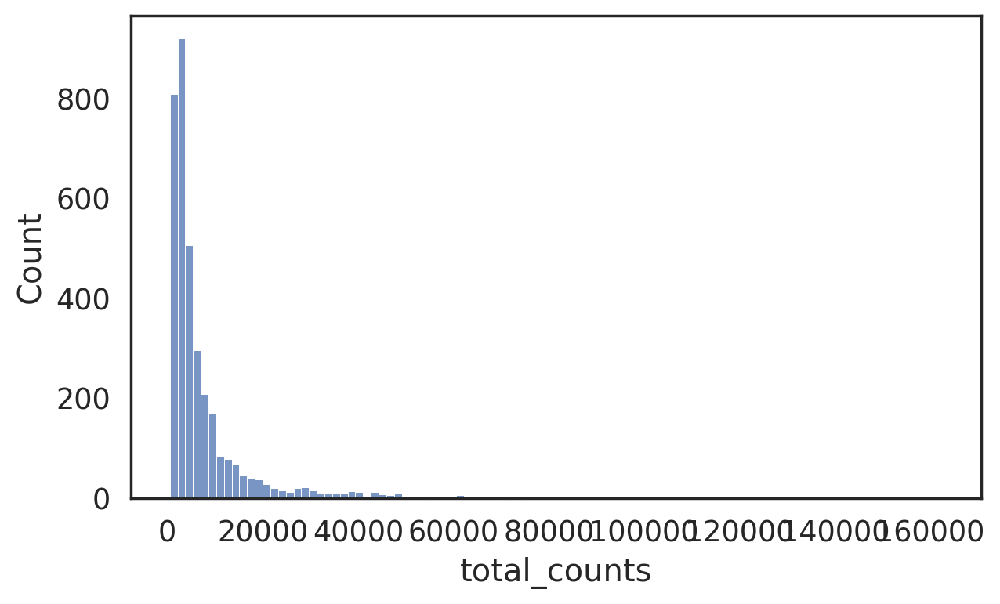

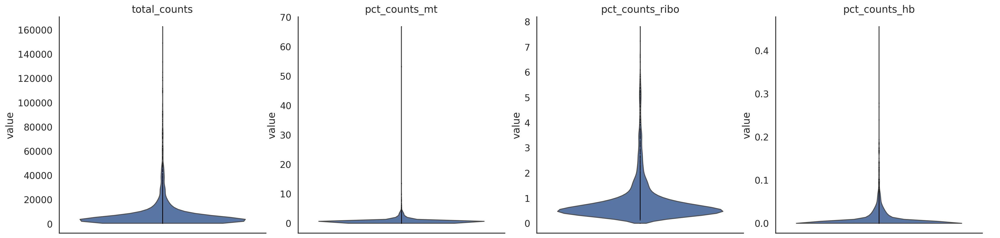

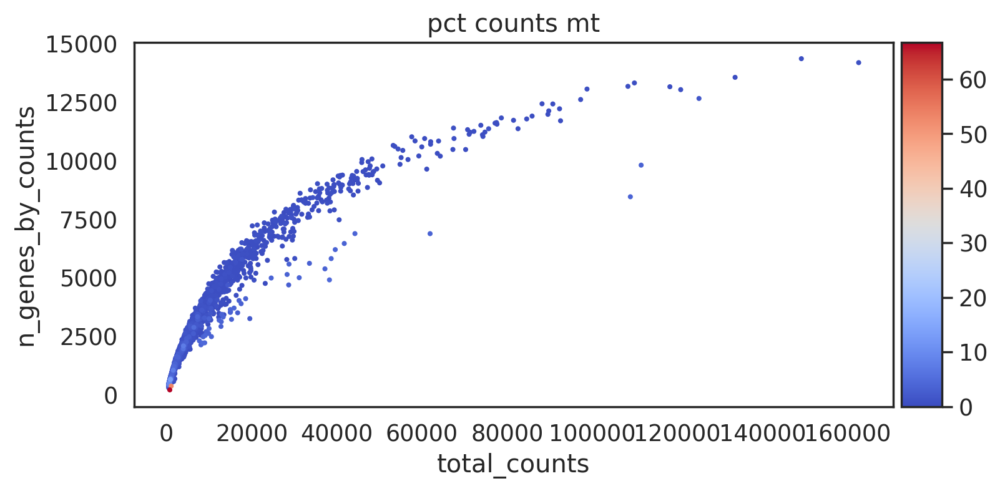

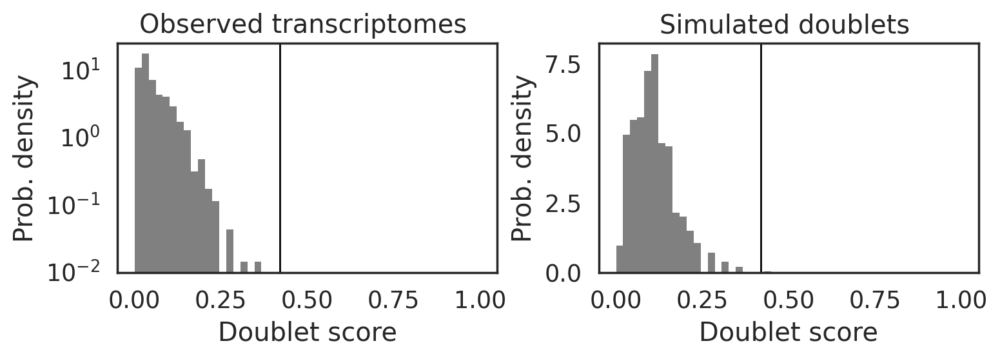

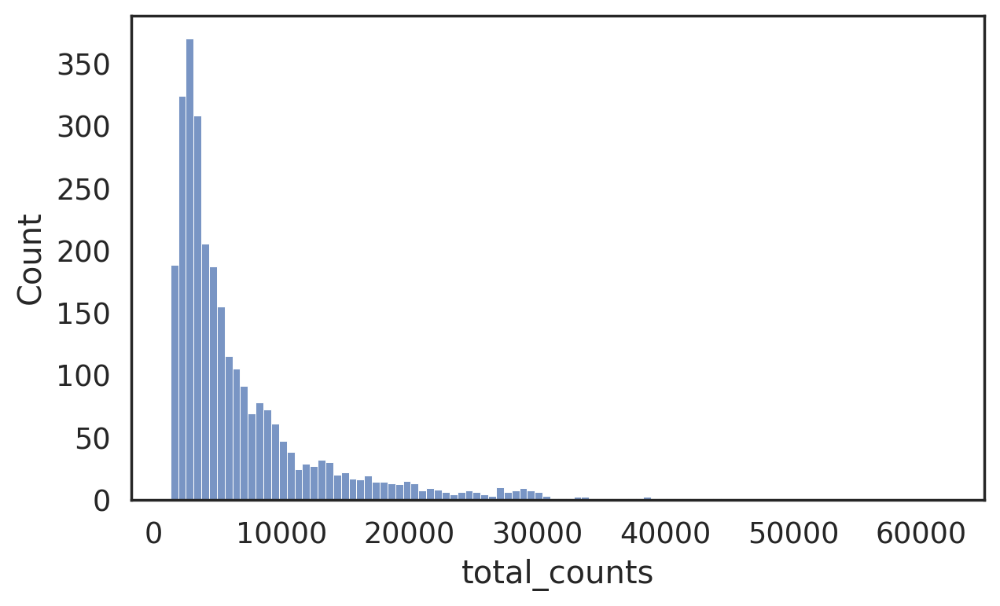

...

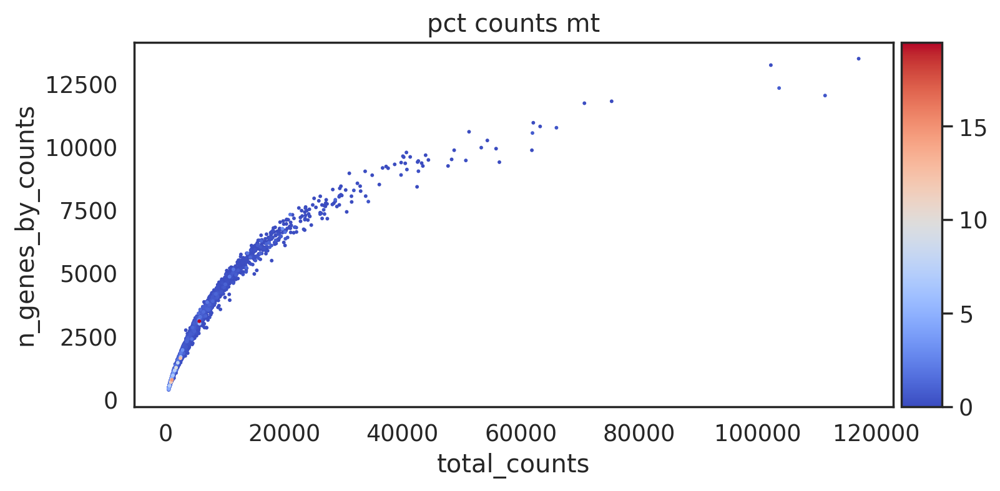

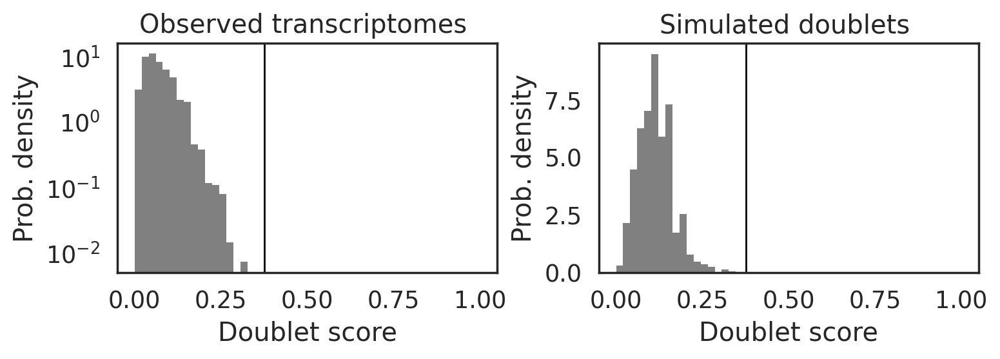

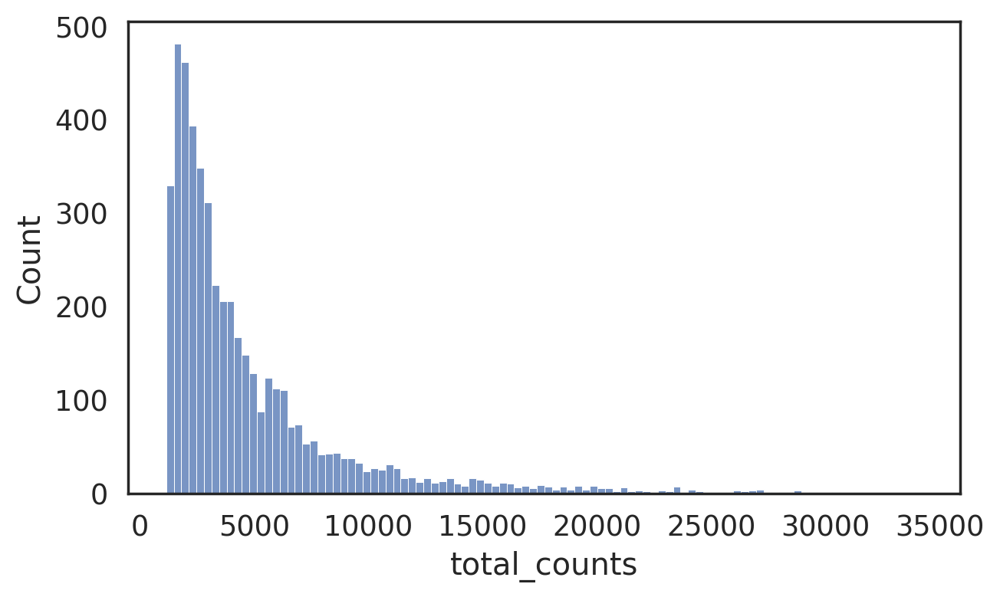

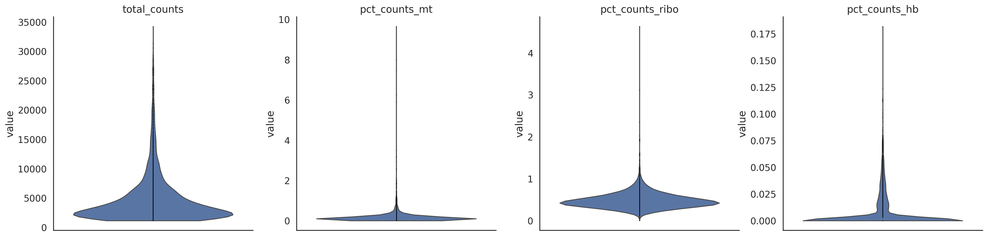

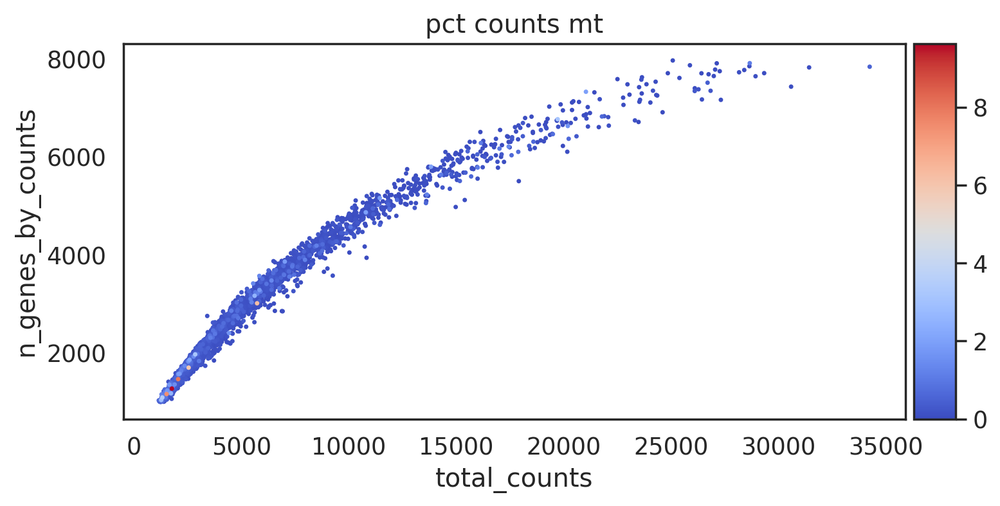

[AnnData object with n_obs × n_vars = 2856 × 27646
     obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
     uns: 'scrublet'
     layers: 'raw_counts',
 AnnData object with n_obs × n_vars = 4779 × 26814
     obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_co

In [116]:
adata_list=list()
adata_1_filtered=preprocess(adata_1_raw,"T10")
adata_list.append(adata_1_filtered)
adata_2_filtered=preprocess(adata_2_raw,"U11")
adata_list.append(adata_2_filtered)

adata_list

# CONCATENATE THE DATASETS

Now we are gonna concatenate the two samples into a single dataset.
This is a standard procedure after cleaning the sample indipendently, you merge everything into a single anndata and proceed with normalization and downstream analysis

In [117]:
adata=sc.concat(adata_list,join="outer")
adata.obs_names_make_unique()
adata

/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/scancellieri/miniconda3/envs/scanpy_workshop/lib/python3.9/site-packages/anndata/_core/anndata.py:1754: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 7635 × 29073
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_genes'
    layers: 'raw_counts'

# CHECK CORRECTEDNESS OF LAYERS AND QC

In [119]:
adata.layers["raw_counts"] != adata.X

<7635x29073 sparse matrix of type '<class 'numpy.bool_'>'
	with 0 stored elements in Compressed Sparse Row format>

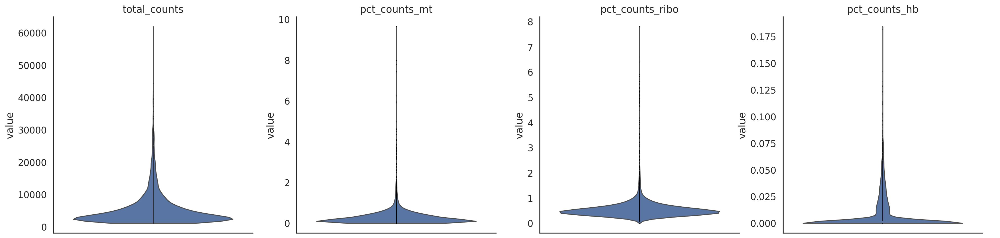

In [120]:
sc.pl.violin(adata, ["total_counts","pct_counts_mt","pct_counts_ribo","pct_counts_hb"], multi_panel=True, jitter=False)

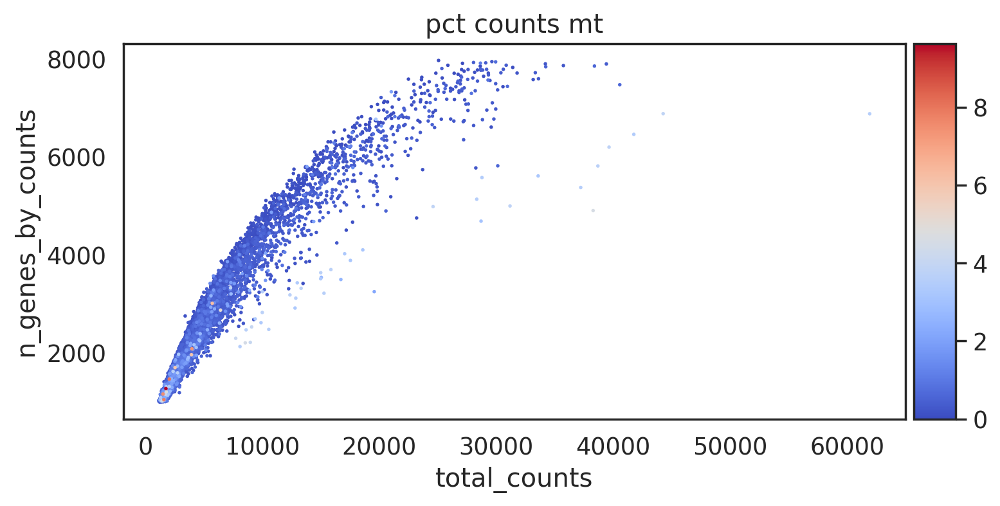

In [121]:
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

# PROCEED TO NORMALIZE

Normalization of counts with a specific target sum (it's like CPM normalization if we put target_sum=1e6).
This is a debated topic, but it's a common practice to normalize the counts to a specific target sum, usually you check the total count order of magnitude
and you normalize to 1e4 or 1e6 based on that. usually will be 1e4 or 1e5, rarely 1e6 since milion of counts is not common in single cell data at the moment.
This normalization can be called also without any target_sum, in this way scanpy will take care of using the median raw count depth of the dataset.

In [ ]:
# normalize the counts
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1p_norm_median"] = sc.pp.log1p(scales_counts["X"], copy=True)

# normalize the counts
scales_counts = sc.pp.normalize_total(adata, target_sum=1e4, inplace=False)
# log1p transform
adata.layers["log1p_norm_1e4"] = sc.pp.log1p(scales_counts["X"], copy=True)

# normalize the counts
scales_counts = sc.pp.normalize_total(adata, target_sum=1e6, inplace=False)
# log1p transform
adata.layers["log1p_norm_1e6"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(22, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0],legend=False)
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm_median"].sum(1), bins=100, kde=False, ax=axes[1],legend=False)
axes[1].set_title("Shifted logarithm")
p3 = sns.histplot(adata.layers["log1p_norm_1e4"].sum(1), bins=100, kde=False, ax=axes[2],legend=False)
axes[2].set_title("Shifted logarithm with target sum 1e4")
p4 = sns.histplot(adata.layers["log1p_norm_1e6"].sum(1), bins=100, kde=False, ax=axes[3],legend=False)
axes[3].set_title("Shifted logarithm with target sum 1e6")
sns.despine()
plt.show()

WHICH ONE IS THE BEST NORMALIZATION? AND WHY?

After you decide, just copy paste the code and let scanpy overwrite the default matrix (this will normalize all the layers also, to avoid this you need to manually save them or set inplace=false and then set all the matrix manually)

In [122]:
sc.pp.normalize_total(adata, target_sum=None, inplace=True)

In [123]:
sc.pp.log1p(adata)

# SELECTING VARIANT GENES AND WHY

In this section we will extract the highly variable genes from the dataset.
This genes are selected to reduce the dimensionality of the data and because variability is considered an important feature to highlight in the dataset.
So we compute the variability (means and dispersion) and then we select how many genes we want to keep (usually I go with 10%-15% of the total).
These rules are not written in stone, that's why you can also decide how to select them (i.e., change the parameters in the function) or simply find them and then add a subset of genes that you consider important in your dataset (like well know marker genes).

In [124]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

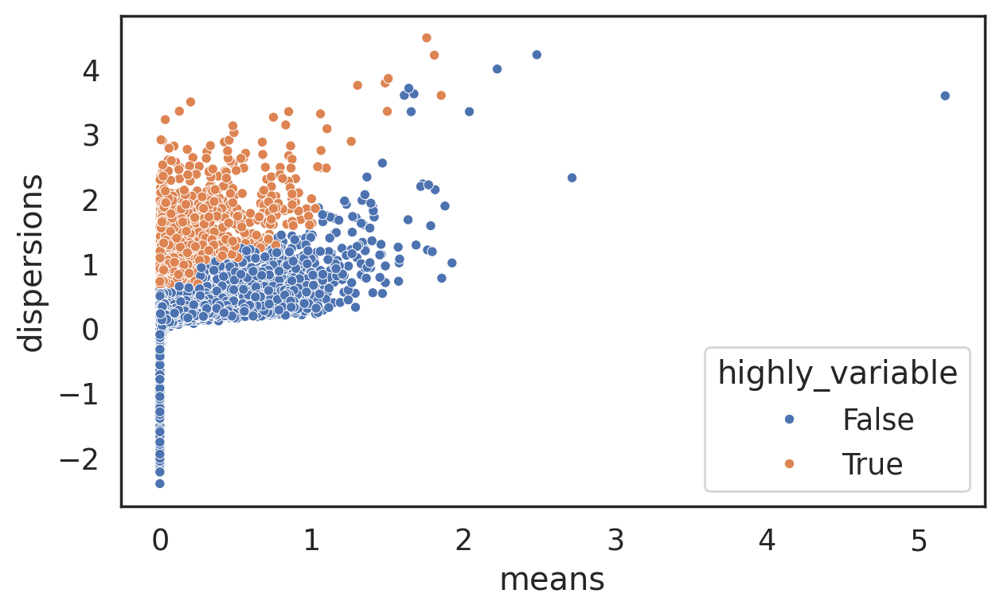

In [125]:
sns.scatterplot(data=adata.var, x="means", y="dispersions", hue="highly_variable", s=20)
plt.show()

In [126]:
df_marker_genes=pd.read_csv(f"{WP}/marker_genes_pdac.csv")
df_marker_genes.head()

,tissueType,cellName,geneSymbolmore1
0,Pancreas,Acinar_cells,CTRB1;KLK1;RBPJL;PTF1A;CELA3A;PRSS1;SPINK1;ZG1...
1,Pancreas,Alpha_cells,GCG;TTR;ARX;POU3F4;NKX2-2;RESP18;PYY;PCSK2;SLC...
2,Pancreas,Beta_cells,FXYD2;PDX1;INS;GCGR;JPH3;CD40;HAMP;EZH1;NTRK1;...
3,Pancreas,Delta_cells,SST;PDX1;FFAR4;PCSK9;RBP4;PAX4;RESP18;HHEX;ISL...
4,Pancreas,Ductal_cells,CFTR;HNF1B;KRT20;MUC1;ONECUT1;AMBP;HHEX;ANXA4;...


In [127]:
df_marker_genes['geneSymbolmore1']=df_marker_genes['geneSymbolmore1'].apply(lambda x: x.split(";"))
df_marker_genes=df_marker_genes.explode('geneSymbolmore1')
df_marker_genes['geneSymbolmore1']=df_marker_genes['geneSymbolmore1'].apply(lambda x: x.upper())
df_marker_genes.head()

,tissueType,cellName,geneSymbolmore1
0,Pancreas,Acinar_cells,CTRB1
0,Pancreas,Acinar_cells,KLK1
0,Pancreas,Acinar_cells,RBPJL
0,Pancreas,Acinar_cells,PTF1A
0,Pancreas,Acinar_cells,CELA3A


In [128]:
# Extract the genes from df_marker_genes
marker_genes = df_marker_genes['geneSymbolmore1'].unique()

# Mark these genes as highly variable in adata
adata.var['highly_variable'] = adata.var.index.isin(marker_genes) | adata.var['highly_variable']

# Verify the changes
print(adata.var['highly_variable'].value_counts())

highly_variable
False    26882
True      2191
Name: count, dtype: int64


Adding the marker genes to the variable ones can be considered a 'cheating' move, but we are doing it because we know that sparsity and technical limitations are two key problems of single cell rna sequencing, and the direct consequences of these problems are the inevitable loss of important genes in our expression matrix.
These can lead to the loss of important and significant information.
Of couse all these operation has to be done in a 'unbiased' manner. For the purpose of this workshop, i am not gonna do the process two times, but you should do it with and without your added genes, to see if the results is similar, better or worse.
Single cell analysis is still at the stage of 'experimental' design, so we can play with it and understand what is going on.
Don't be scared of playing with your data and try to grasp and capture the true meaning of what you see.

Here we can decided to keep only the higlhy variable genes in our dataset (for simplicity).
These operation will save sometime in the future processing (even if many operations are automatically performed only on highly variable genes).
Remember that the original counts will be save in the .raw subobject of adata (adata.raw is an anndata object inside the anndata object (python is crazy)), so it is not necessary to worry about it, it's just a matter of habit.
I usually keep them with me for the whole processing and remove them only if the operation i'm gonna compute will use all the genes in the dataset.

In [ ]:
# adata=adata[:,adata.var['highly_variable']].copy()

# LET'S DO DIMENSIONALITY REDUCTION

We will start with the king of dimensionality reductions algorithm, PRINCIPAL COMPONENT ANALYSIS.
PCA will help us visualize if our data are separating as we expect.
Unfortunately in single cell RNA seq, the separation will probably occur on the entire sample cell clusters, even if the tissue is the same.
This is due to heterogeneity of samples (different specimen) and inevitable noise of the experiment even if it's done in perfect conditions and at the same time.

## PCA

In [129]:
sc.pp.pca(adata, svd_solver="arpack", mask_var="highly_variable")

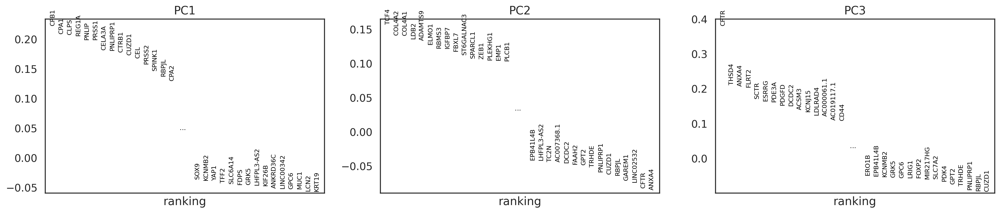

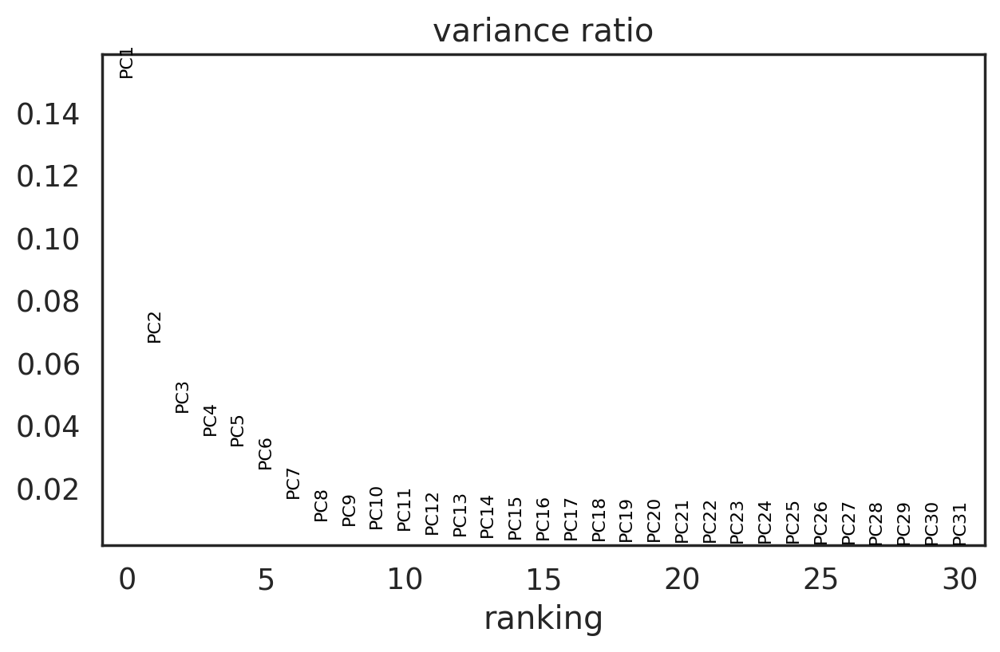

In [130]:
sc.pl.pca_loadings(adata)
sc.pl.pca_variance_ratio(adata)

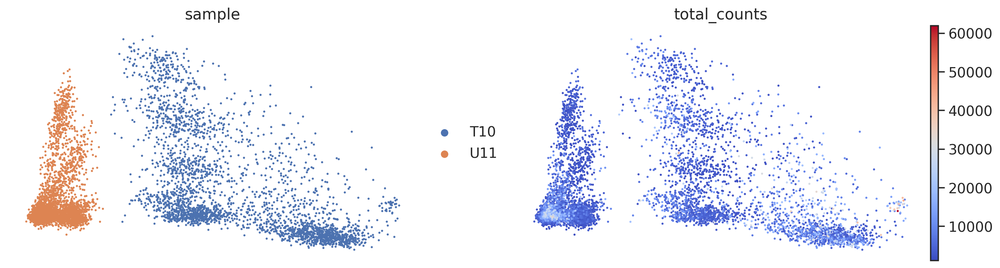

In [131]:
sc.pl.pca_scatter(adata, color=["sample","total_counts"])

## t-SNE

In [132]:
sc.tl.tsne(adata, use_rep="X_pca")

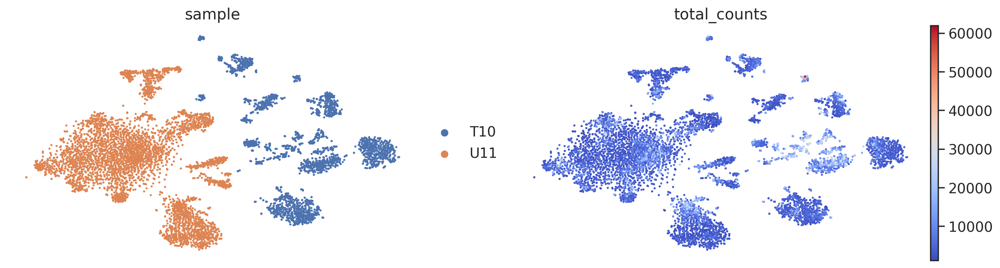

In [134]:
sc.pl.tsne(adata, color=["sample","total_counts"])

## UMAP

In [136]:
sc.pp.neighbors(adata,n_neighbors=30, n_pcs=10)
sc.tl.umap(adata)

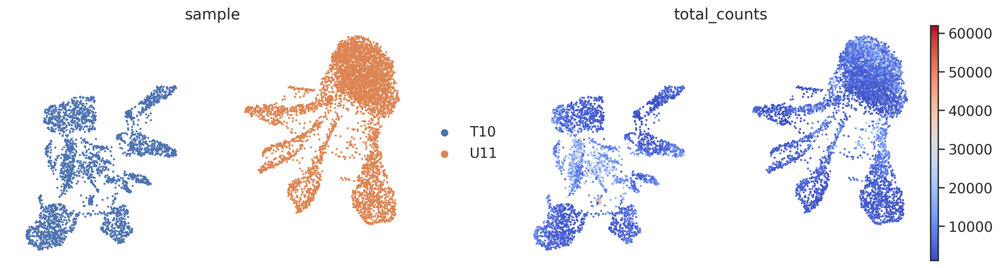

In [137]:
sc.pl.umap(adata, color=["sample","total_counts"])

OK, now we can evaluate what is happening to our data.
Why the three different algorithms creates such different results?

# GO CLUSTERING GO

This embarassing paragraph title is here to help you understand how clustering works in the context of single cell.
And the answer is, we just cheer on the cluster technique or parameters that better explain our data.
That's why is so important to know exactly what we are dealing with.

What are the expected cell types in our dataset? Is disease v healthy? Is control v treatment? Is temporally based data?

All these questions can help us understand what we are seeing coming out of the data and how we can interpret them.

Here we will use the most common KNN algorithm for umap based clustering.
Leiden was developed to be used in this datatype and takes as base the neighbours calculated previously to generate the UMAP

In [141]:
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25, flavor="igraph", n_iterations=2)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5, flavor="igraph", n_iterations=2)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0, flavor="igraph", n_iterations=2)

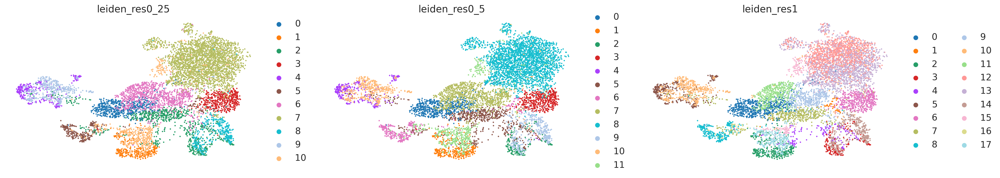

In [183]:
sc.pl.umap(adata, color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"])

Looking at this plot we can immediately see that the two samples are incredibly splitted and the cell contents it's heterogeneous.
Deciding which representation is better can be hard since no truth exists.

Again, having an idea of what our data should contain or not, is the best approach to deal with the clustering.
Why we get those clusters? What they represent?
After answering these questions, we can choose what we think is the best representation for our data and to answer our initial hypothesis.

# BATCH CORRECTION AND SAMPLE MERGING

Another big problem in single cell analysis is the terrible effect of batches and the intrinsic differences between specimen.
As we see in our umaps, both these effects are occuring, even if we are using just two samples.

We will try different approaches to perform batch correction over the samples and keep the one that 'makes more sense' in our data.
I think by now you understood what is the flow of process when we deal with single cells.

Keep a copy of the original umap and pca

In [144]:
adata.obsm['X_umap_original']=adata.obsm['X_umap']
adata.obsm['X_pca_original']=adata.obsm['X_pca']

## BBKNN

In [178]:
adata.obsm['X_pca']=adata.obsm['X_pca_original']
adata.obsm['X_umap']=adata.obsm['X_umap_original']

In [179]:
sc.external.pp.bbknn(adata, batch_key='sample')

In [180]:
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_knn_merged', flavor="igraph", n_iterations=2)

In [181]:
adata.obsm['X_umap_knn']=adata.obsm['X_umap']

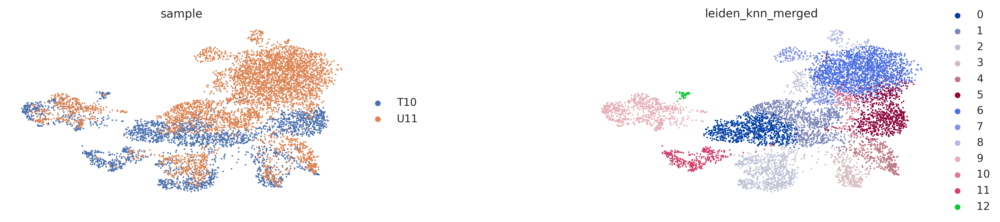

In [182]:
sc.pl.umap(adata, color=['sample','leiden_knn_merged'], wspace=0.5)

## HARMONY

In [184]:
sc.external.pp.harmony_integrate(adata, key="sample",basis='X_pca_original')

2024-12-09 14:29:35,189 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-09 14:29:38,788 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-09 14:29:39,003 - harmonypy - INFO - Iteration 1 of 10
2024-12-09 14:29:43,994 - harmonypy - INFO - Iteration 2 of 10
2024-12-09 14:29:49,089 - harmonypy - INFO - Iteration 3 of 10
2024-12-09 14:29:53,335 - harmonypy - INFO - Converged after 3 iterations


In [185]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=10, use_rep="X_pca_harmony")
sc.tl.umap(adata)

In [186]:
adata.obsm['X_umap_harmony']=adata.obsm['X_umap']

In [187]:
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_harmony', flavor="igraph", n_iterations=2)

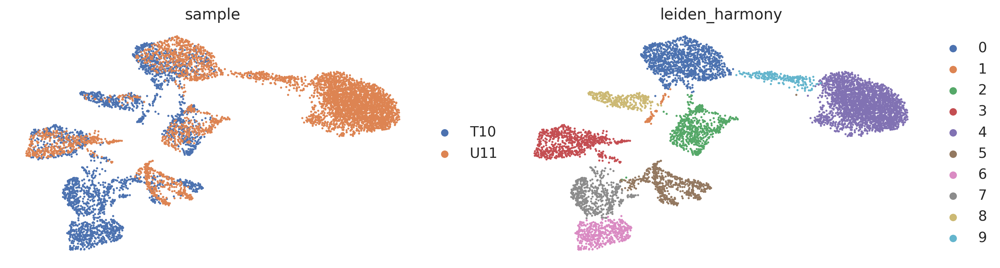

In [188]:
sc.pl.umap(adata, color=["sample","leiden_harmony"])

## SCVI

I will not introduce scVI model here to batch correction becuase is a deep learning model that needs to be trained on the data and can take many minutes/hours depending on the hardware (GPU/noGPU), so i will just write the code that you can test if you have access to a GPU or a bit more time.

This model is really powerful, sometime too much. It can overcorrect your data merging all the cells into an indistinguishable blob where all the meanings are lost, so be careful when you use it and check what is coming out before going forward.

In [ ]:
# import scvi
# import scvi.external
# import torch

In [ ]:
## SETTING TO USE TENSOR CORES
# torch.set_float32_matmul_precision('high')

In [ ]:
# scvi.model.SCVI.setup_anndata(adata, layer='raw_counts',categorical_covariate_keys=['sample'],continuous_covariate_keys=['total_counts','pct_counts_mt','pct_counts_ribo'])
# model = scvi.model.SCVI(adata)

In [ ]:
# model.train()

In [ ]:
# adata.obsm['X_scVI']=model.get_latent_representation()

In [ ]:
# adata.layers['scvi_normalized']=model.get_normalized_expression(library_size=1e4)

In [ ]:
# sc.pp.neighbors(adata, use_rep='X_scVI')

In [ ]:
# sc.tl.umap(adata)
# sc.tl.leiden(adata, resolution=0.5,key_added='leiden_scVI',flavor="igraph", n_iterations=2)

In [ ]:
# adata.obsm['X_umap_scVI']=adata.obsm['X_umap']

In [ ]:
# sc.pl.umap(adata, color=["sample","leiden_scVI"])

# CELL ANNOTATION

We finally reached the step all of you were waiting for.
The infamous cell annotation step.

Many before fall attempting to perform this, many after will falling trying to replicate this.

I trust you and I know you will be able to do it, but if you will fall, your memory will be with us forever.

Let's start with ranking the most different expressed genes between groups based on the clustering obtained after batch correction

## GENE RANKING

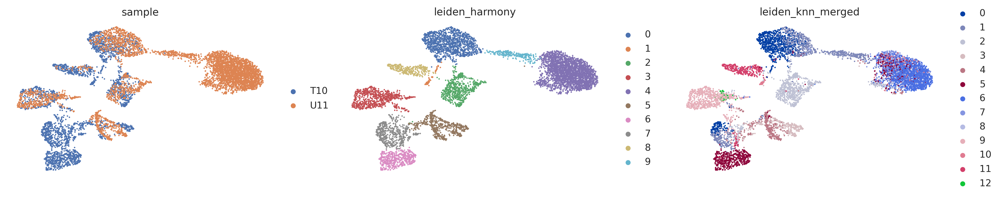

In [193]:
sc.pl.umap(adata, color=["sample","leiden_harmony","leiden_knn_merged"])

In [190]:
clustering_group="leiden_harmony"

This function will calculate the variable genes (DE) comparing each group against the sum of all the other groups (0 v all, 1 v all, etc).
This operation will return the most differential expressend genes in group X, giving you an insight of which cells are in that cluster.

These sets of top ranking genes for each cluster will be used to annotate each cluster with a celltype.

In [192]:
sc.tl.rank_genes_groups(adata, groupby=clustering_group, method="wilcoxon", use_raw=False)

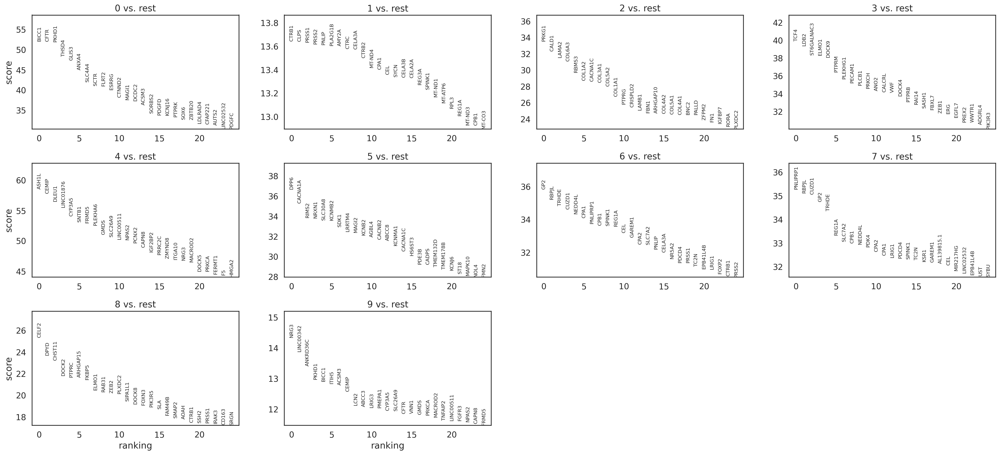

In [194]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

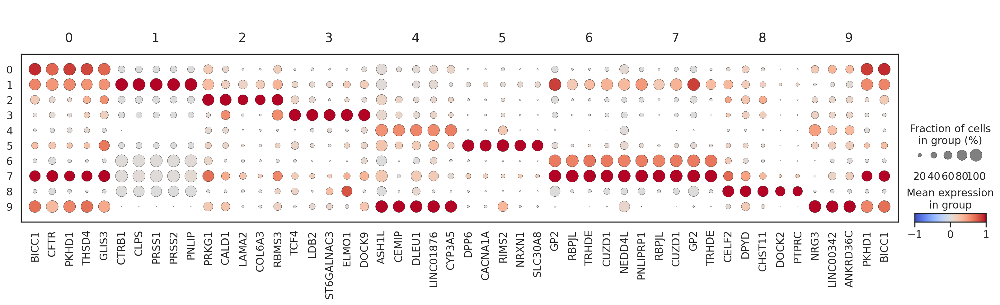

In [205]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, swap_axes=False, vcenter=0, dendrogram=False, standard_scale="var", cmap='coolwarm')

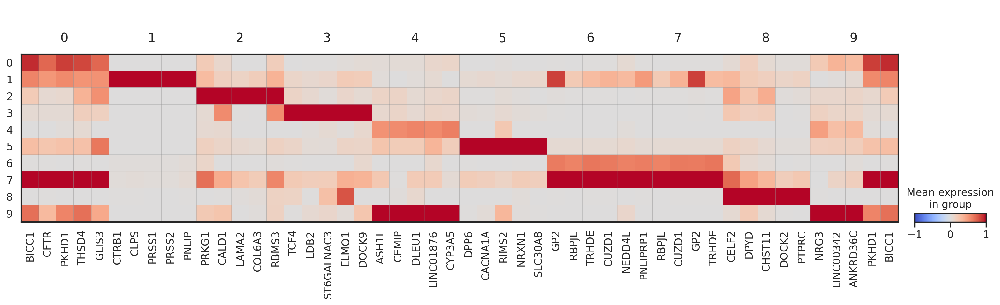

In [204]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, swap_axes=False, vcenter=0, dendrogram=False, standard_scale="var", cmap='coolwarm')

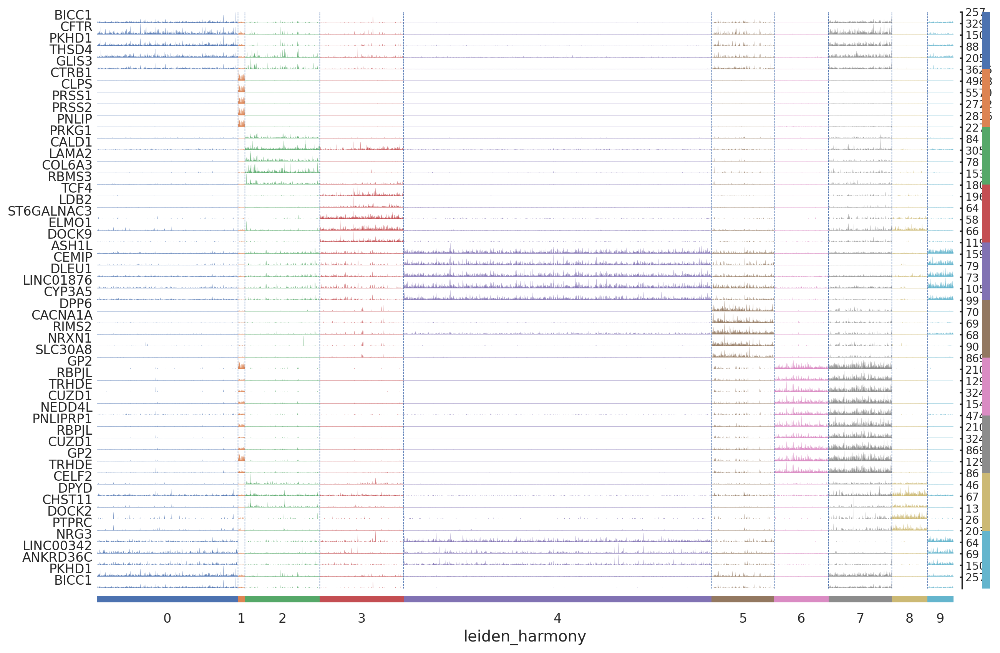

In [211]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=5, dendrogram=False, standard_scale="var", cmap='coolwarm', figsize=(15, 10))

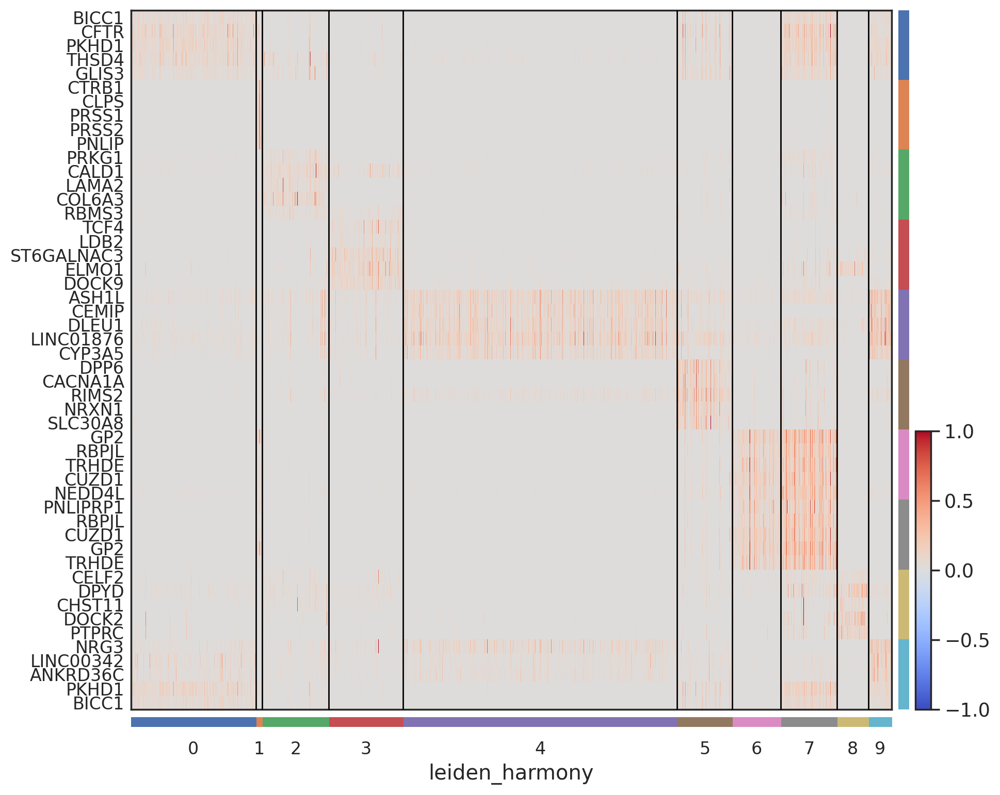

In [219]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, vcenter=0, swap_axes=True, dendrogram=False, standard_scale="var", cmap='coolwarm')

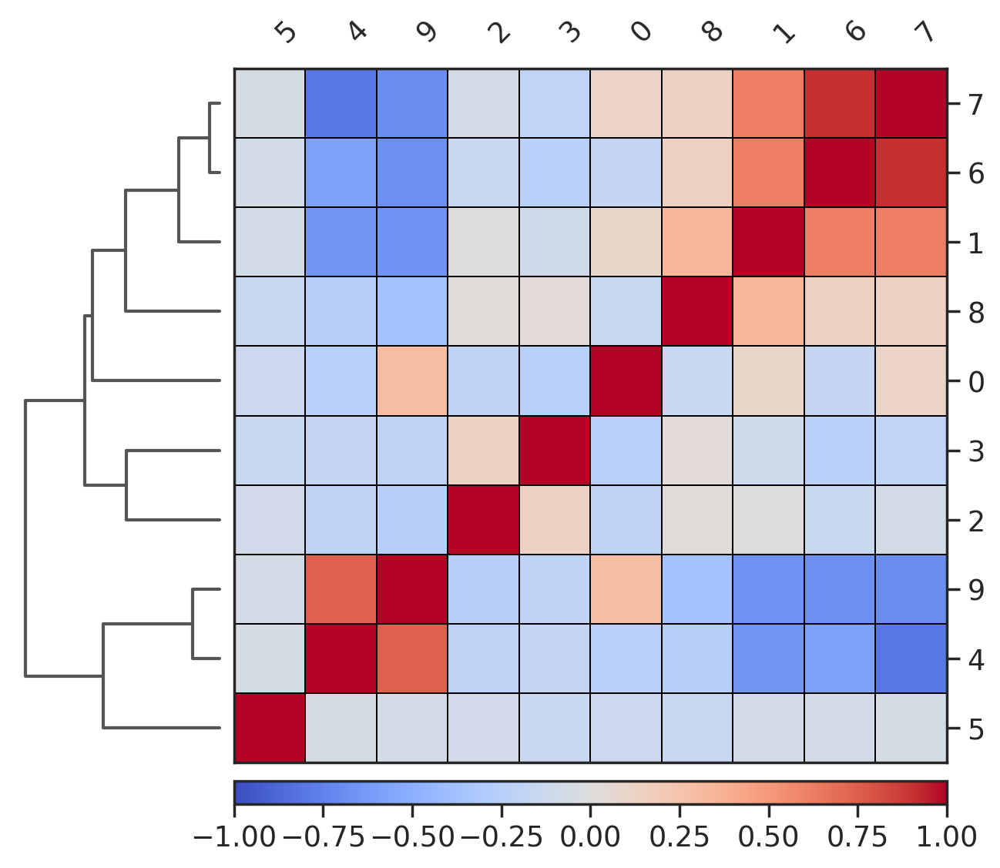

In [229]:
sc.pl.correlation_matrix(adata, groupby=clustering_group, cmap='coolwarm')

The plots you generated now will help you in understanding what genes are more expressed in these clusters (an hopefully cell types)

The dataframe we are extracting here from the data, contains the results of the ranking and can be used for any purpose

In [246]:
df_rank=sc.get.rank_genes_groups_df(adata,group=None,pval_cutoff=0.05)
df_rank['abs_log2fc']=np.abs(df_rank['logfoldchanges'])
df_rank.query('abs_log2fc>1.5',inplace=True)
df_rank

,group,names,scores,logfoldchanges,pvals,pvals_adj,abs_log2fc
0,0,BICC1,52.056232,4.406503,0.000000e+00,0.000000e+00,4.406503
1,0,CFTR,52.002914,4.856068,0.000000e+00,0.000000e+00,4.856068
2,0,PKHD1,51.923122,4.303712,0.000000e+00,0.000000e+00,4.303712
3,0,THSD4,48.286911,3.400563,0.000000e+00,0.000000e+00,3.400563
4,0,GLIS3,47.330055,3.245045,0.000000e+00,0.000000e+00,3.245045
...,...,...,...,...,...,...,...
54687,9,CPB1,-9.694959,-7.176948,3.167660e-22,8.770799e-20,7.176948
54688,9,PNLIP,-9.702959,-6.473986,2.928778e-22,8.187342e-20,6.473986
54689,9,PRSS1,-9.726493,-6.224385,2.324694e-22,6.729567e-20,6.224385
54690,9,CLPS,-9.754715,-6.161323,1.760940e-22,5.332896e-20,6.161323


## MANUAL ANNOTATION

Now we will proceed to some manual annotation, we will annotate some clusters just to let you know how it's done. The suggested procedure is to go with an automated procedure and then go deep into refining with manual intervention.

In [349]:
annotation_dict = dict()
for group in sorted(adata.obs[clustering_group].unique()):
    annotation_dict[group]=None
    
print(annotation_dict)

{'0': None, '1': None, '2': None, '3': None, '4': None, '5': None, '6': None, '7': None, '8': None, '9': None}


Extract some markers from the marker gene set will help us get an idea of what we have in the data.
Some markers will be expressed in 0-1 cluster, some in 1-2 and some in 2+. Of course the 0-2 will be easy to annotate and consider good, but when markers are too spread around the clusters, we will need to use more markers or so called 'negative markers', set of genes that are rarely or never expressed in a cell type.

In [350]:
fast_markers=df_marker_genes.groupby('cellName').head(3)
fast_markers_list=sorted(fast_markers['geneSymbolmore1'].unique())

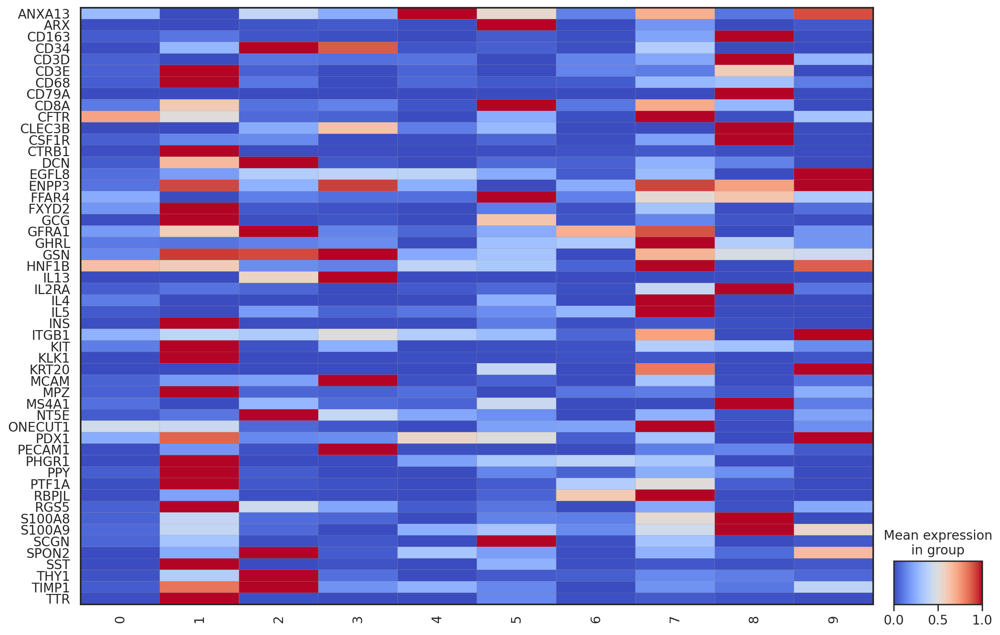

In [351]:
sc.pl.matrixplot(adata,fast_markers_list,groupby=clustering_group,swap_axes=True,cmap='coolwarm',standard_scale='var',figsize=(15,10))

In [352]:
annotation_dict['1']='acinar'
annotation_dict['9']='ductal'
annotation_dict['3']='endothelial'

In [354]:
adata.obs['cell_type']=adata.obs[clustering_group].map(annotation_dict)
adata.obs['cell_type'].value_counts()

cell_type
endothelial    748
ductal         232
acinar          63
Name: count, dtype: int64

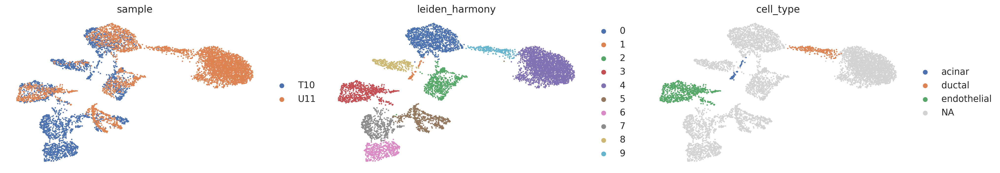

In [355]:
sc.pl.umap(adata,color=['sample',clustering_group,'cell_type'])

Now you know how to perform a manual annotation of cells, this is unfortunately a long and time consuming operation. So it's done only when absolutely necessary or to correct some wrong automatic annotation.

## AUTOMATIC ANNOTATION

The first method I will introduce for automatic cell annotation is integrated in decoupler and uses the ORA (over representation analysis) principle to associate each cell with the closer cell type, based on the result of fisher's exact test against the most represented set of variables (genes) in the analyzed group.

### ORA ANNOTATION

In [356]:
df_marker_genes.columns

Index(['tissueType', 'cellName', 'geneSymbolmore1'], dtype='object')

We extract the marker genes from the dataframe we read before and remove any duplicate (just to avoid problem with the model)

In [357]:
# Remove duplicated entries
df_marker_genes = df_marker_genes[~df_marker_genes.duplicated(["cellName", "geneSymbolmore1"])]
df_marker_genes.reset_index(drop=True, inplace=True)
df_marker_genes.head()

,tissueType,cellName,geneSymbolmore1
0,Pancreas,Acinar_cells,CTRB1
1,Pancreas,Acinar_cells,KLK1
2,Pancreas,Acinar_cells,RBPJL
3,Pancreas,Acinar_cells,PTF1A
4,Pancreas,Acinar_cells,CELA3A


In [358]:
dcp.run_ora(mat=adata, net=df_marker_genes, source='cellName', target='geneSymbolmore1', min_n=5, verbose=True, use_raw=False)

31 features of mat are empty, they will be removed.
Running ora on mat with 7635 samples and 29042 targets for 15 sources.


  0%|          | 0/7635 [00:00<?, ?it/s]

Here we get the results (obsm key are dataframes with nrows equal to cells and columns equal to whatever, in this case are the number of annotations in the marker genes dataframe)

In [379]:
adata.obsm['ora_estimate'].head()

source,Acinar_cells,Alpha_cells,Beta_cells,Col15a1+_Fibroblast,Delta_cells,Ductal_cells,Endothelial_cells,Epsilon_cells,Gamma_(PP)_cells,Mast_cells,Mesenchymal_cells,Pancreatic_progenitor_cells,Pancreatic_stellate_cells,Peri-islet_Schwann_cells,Pi16+_Fibroblast
AAACCCAAGTGGTCAG-1,5.809731,0.104448,0.171599,0.502802,0.698626,1.151203,-0.000000,0.047638,0.065771,-0.000000,-0.000000,0.567681,-0.000000,0.154292,0.502802
AAACCCACACGAGGTA-1,7.483283,-0.000000,0.171599,1.341984,-0.000000,-0.000000,0.792879,0.768940,-0.000000,-0.000000,-0.000000,0.185580,1.812506,0.486950,1.341984
AAACCCAGTGTTCGAT-1,6.625426,5.694294,2.764195,-0.000000,0.040635,0.174350,-0.000000,-0.000000,0.534673,-0.000000,0.438863,0.185580,-0.000000,0.154292,-0.000000
AAACCCAGTTCTATCT-1,14.605904,0.023481,-0.000000,-0.000000,-0.000000,0.404788,-0.000000,-0.000000,0.534673,-0.000000,-0.000000,0.567681,0.185580,0.486950,-0.000000
AAACGCTCAGAGCTAG-1,11.318766,0.262749,0.062916,0.502802,0.040635,-0.000000,1.505906,0.427661,0.534673,0.343799,-0.000000,0.185580,0.567681,0.154292,0.502802


In [359]:
acts = dcp.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 7635 × 15
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_genes', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_knn_merged', 'leiden_harmony', 'cell_type', 'ora_cell_type', 'mlm_cell_type'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'leiden_knn_merged', 'leiden_knn_merged_colors', 'leiden_harmony', 'leiden_harmony_colors', 'rank_genes_groups', 'dendrogram_leiden_harmony', 'cell_type_colors', 'ora_cell_type_colors', 'mlm_cell_type_colors', 'dendrogram_mlm_cell_ty

We extract the rank of each group against all the other to get the top scoring set of genes for each cluster and get the annotate label

In [360]:
df = dcp.rank_sources_groups(acts, groupby=clustering_group, reference='rest', method='wilcoxon')
df.query('pvals_adj<0.05',inplace=True)
df.sort_values(by=['group','statistic','pvals_adj'], ascending=[True,False,True],inplace=True)
df_ora = df.copy()
df.head()

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Ductal_cells,30.983716,0.797873,8.933667e-211,1.340050e-209
1,0,rest,Epsilon_cells,20.218149,0.048397,6.777918e-91,5.083438e-90
2,0,rest,Delta_cells,19.630144,0.115881,8.547177e-86,4.273588e-85
3,0,rest,Beta_cells,11.405090,-0.084237,3.943700e-30,1.478888e-29
4,0,rest,Gamma_(PP)_cells,9.586519,0.030060,9.110682e-22,2.733205e-21


In [361]:
n_ctypes = 5
ora_ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ora_ctypes_dict
ora_ctypes_dict_df=pd.DataFrame(ora_ctypes_dict)

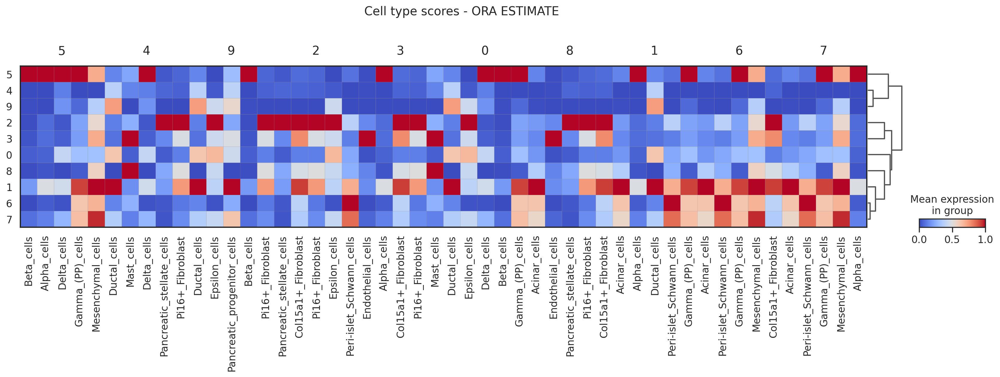

In [362]:
sc.pl.matrixplot(acts, ora_ctypes_dict, groupby=clustering_group, standard_scale='var', dendrogram=True, cmap='coolwarm',title='Cell type scores - ORA ESTIMATE', swap_axes=False)

In [363]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()
adata.obs['ora_cell_type'] = [annotation_dict[clust] for clust in adata.obs[clustering_group]]

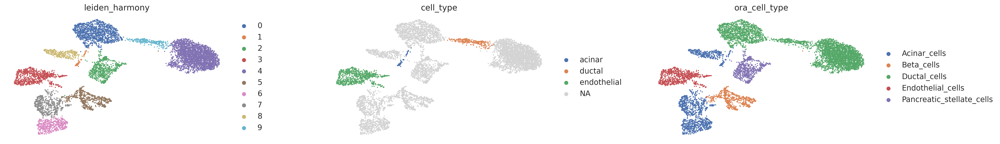

In [364]:
# Visualize
sc.pl.umap(adata, color=[clustering_group, 'cell_type', 'ora_cell_type'],wspace=0.3)

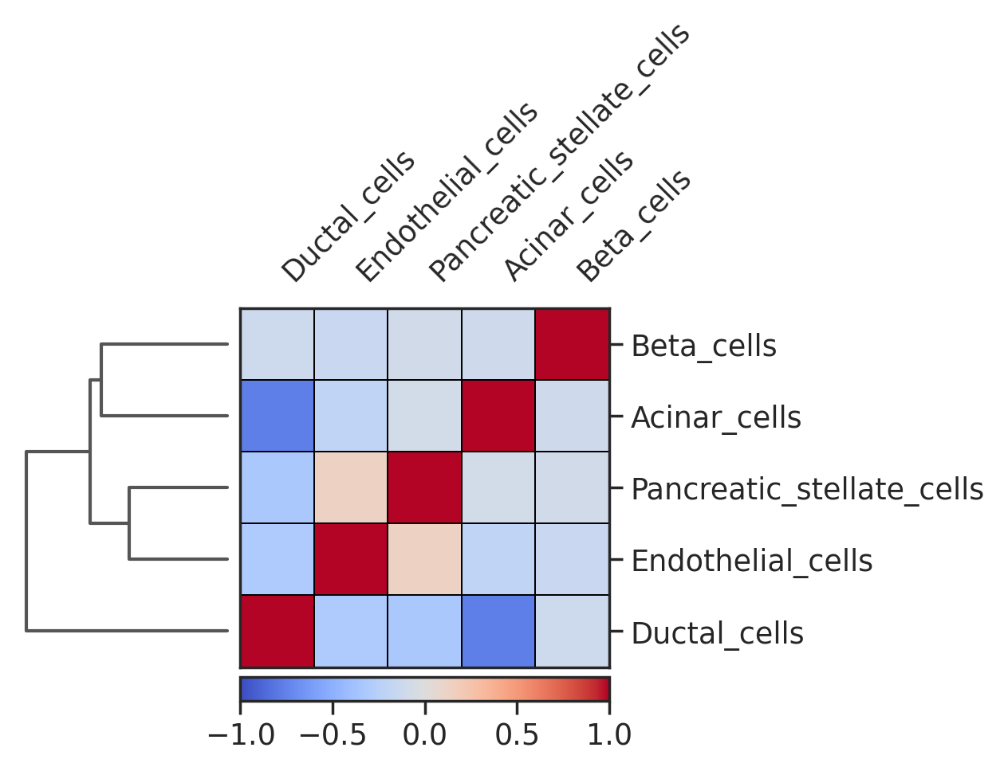

In [365]:
sc.pl.correlation_matrix(adata, groupby='ora_cell_type', cmap='coolwarm')

Here we completed our automatic annotation, this is a standard process to get a first insight on what celltypes are present in the dataset.
As repeated many times, the meaning of our dataset is not gonna pop out from the analysis if we dont know what we are looking at.

### MLM ANNOTATION

Here I will introduce a second way to annotate our clusters, using a multivariate linear model. We will still use decoupler as it provides a lot of good implemented methods to perform these tasks.

In [366]:
dcp.run_mlm(mat=adata, net=df_marker_genes, weight=None, source="cellName", target="geneSymbolmore1", min_n=5, verbose=True, use_raw=False)

31 features of mat are empty, they will be removed.
Running mlm on mat with 7635 samples and 29042 targets for 15 sources.


  0%|          | 0/1 [00:00<?, ?it/s]

In [367]:
acts = dcp.get_acts(adata, obsm_key='mlm_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 7635 × 15
    obs: 'sample', 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'doublet_score', 'predicted_doublet', 'n_genes', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_knn_merged', 'leiden_harmony', 'cell_type', 'ora_cell_type', 'mlm_cell_type'
    uns: 'log1p', 'hvg', 'pca', 'sample_colors', 'tsne', 'neighbors', 'umap', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'leiden_knn_merged', 'leiden_knn_merged_colors', 'leiden_harmony', 'leiden_harmony_colors', 'rank_genes_groups', 'dendrogram_leiden_harmony', 'cell_type_colors', 'ora_cell_type_colors', 'mlm_cell_type_colors', 'dendrogram_mlm_cell_ty

In [368]:
df = dcp.rank_sources_groups(acts, groupby=clustering_group, reference='rest', method='wilcoxon')
df.query('pvals_adj<0.05',inplace=True)
df.sort_values(by=['group','statistic','pvals_adj'], ascending=[True,False,True],inplace=True)
df_mlm = df.copy()
df.head()

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Ductal_cells,43.320538,3.659099,0.000000e+00,0.000000e+00
1,0,rest,Epsilon_cells,36.867935,0.955617,1.509190e-297,1.131893e-296
2,0,rest,Delta_cells,16.476298,0.485918,5.430996e-61,2.715498e-60
3,0,rest,Gamma_(PP)_cells,11.939553,0.326000,7.361789e-33,2.760671e-32
4,0,rest,Beta_cells,7.105472,-0.060140,1.199121e-12,2.997804e-12


In [369]:
n_ctypes = 5
mlm_ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
mlm_ctypes_dict
mlm_ctypes_dict_df=pd.DataFrame(mlm_ctypes_dict)

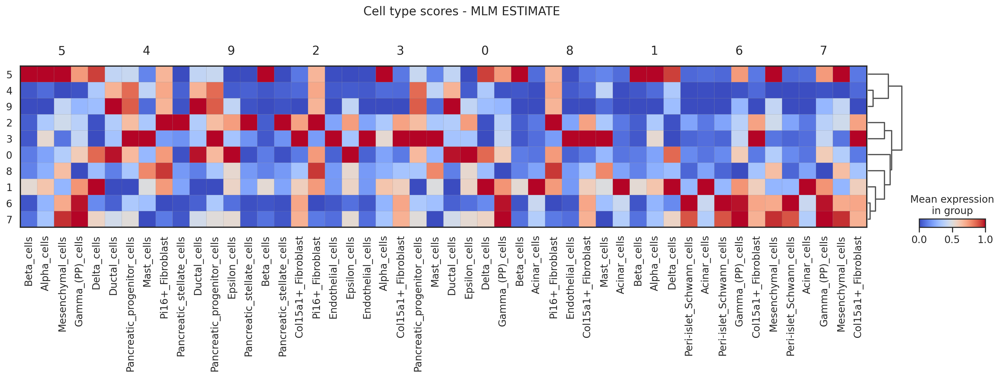

In [370]:
sc.pl.matrixplot(acts, mlm_ctypes_dict, groupby=clustering_group, standard_scale='var', dendrogram=True, cmap='coolwarm',title='Cell type scores - MLM ESTIMATE',swap_axes=False)

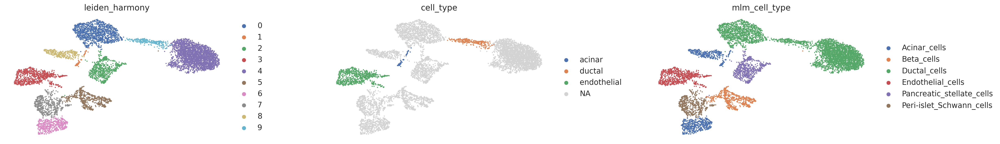

In [371]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()

adata.obs['mlm_cell_type'] = [annotation_dict[clust] for clust in adata.obs[clustering_group]]

# Visualize
sc.pl.umap(adata, color=[clustering_group, 'cell_type', 'mlm_cell_type'],wspace=0.3)

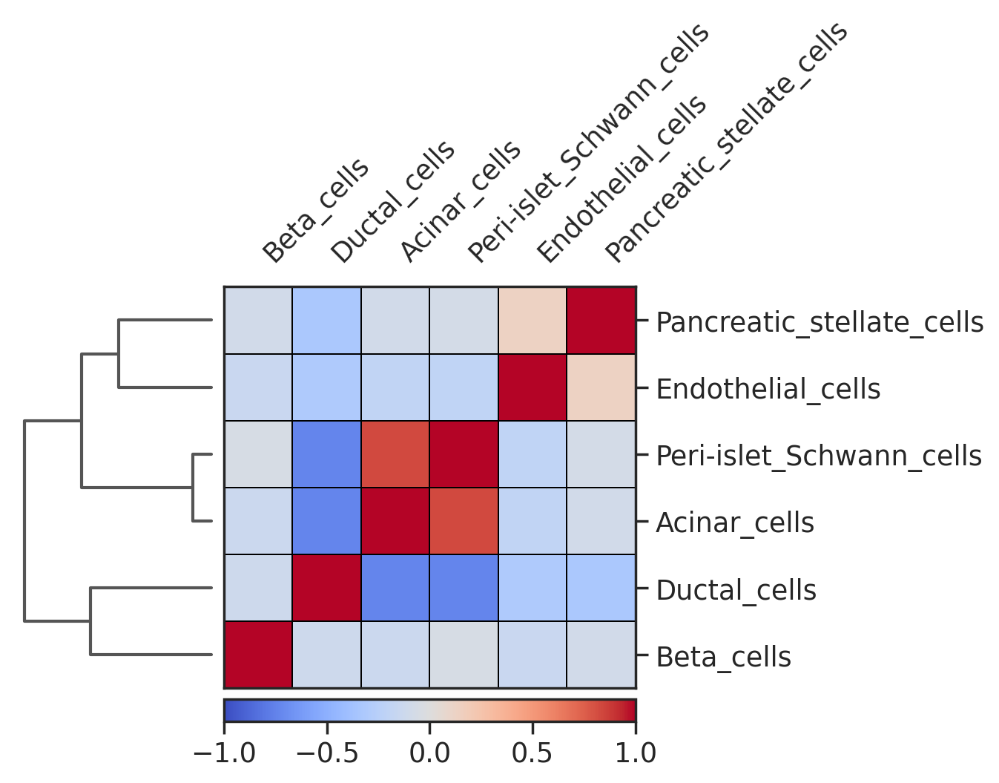

In [372]:
sc.pl.correlation_matrix(adata, groupby='mlm_cell_type', cmap='coolwarm')

## CHECK CONCORDANCE

Here we will check the agreement of ora annotation with the mlm annotation to check if the annotation is robust enough to be considered correct

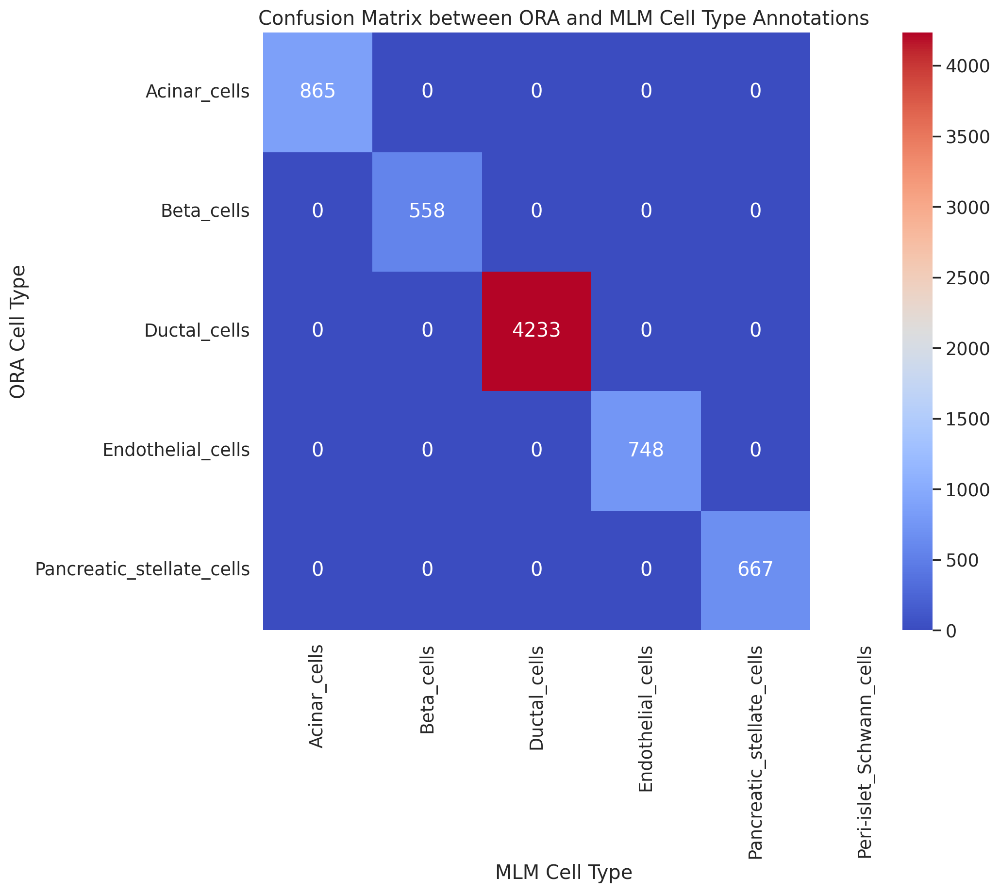

In [373]:
from sklearn.metrics import confusion_matrix

# Create a confusion matrix
conf_matrix = confusion_matrix(y_true=adata.obs['ora_cell_type'], y_pred=adata.obs['mlm_cell_type'], labels=adata.obs['ora_cell_type'].cat.categories)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='coolwarm', xticklabels=adata.obs['mlm_cell_type'].cat.categories, yticklabels=adata.obs['ora_cell_type'].cat.categories)
plt.xlabel('MLM Cell Type')
plt.ylabel('ORA Cell Type')
plt.title('Confusion Matrix between ORA and MLM Cell Type Annotations')
plt.show()

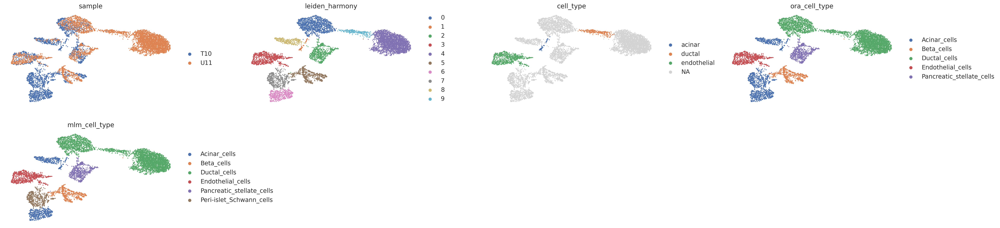

In [374]:
sc.pl.umap(adata, color=['sample',clustering_group,'cell_type','ora_cell_type','mlm_cell_type'], wspace=0.25)

## MANUAL CORRECTION

The last step is to manually correct any error or unknown cluster, in this case we are sure some malignant cells and fibroblast are present in the dataset (this is a PDAC dataset). Probably the clusters of ductal cells contains some malignant cells (we are not going to annotate them now) and the stellate cells are probably CAF (cancer associate fibroblasts).

To check this I am going to print some ranked genes for group 2 (stellate cells) and see if I recognize CAF marker genes [THIS CAN CHANGE IN YOUR ANALYSIS]

In [389]:
df_rank.query('group=="2"').head(20)

,group,names,scores,logfoldchanges,pvals,pvals_adj,abs_log2fc
7670,2,PRKG1,33.543831,3.037902,1.107529e-246,3.219918e-242,3.037902
7671,2,CALD1,32.332752,3.106806,2.424790e-229,3.524796e-225,3.106806
7672,2,LAMA2,31.519825,5.403929,4.648079e-218,4.504454e-214,5.403929
7673,2,COL6A3,31.092031,4.915878,3.086569e-212,2.243396e-208,4.915878
7674,2,RBMS3,29.700214,2.982052,7.629782e-194,4.436413e-190,2.982052
7675,2,COL1A2,28.724874,3.920381,1.866299e-181,9.043153e-178,3.920381
7676,2,CACNA1C,28.613008,2.853914,4.628883e-180,1.922508e-176,2.853914
7677,2,COL3A1,28.496235,4.523846,1.304319e-178,4.740059e-175,4.523846
7678,2,COL5A2,28.023453,4.437842,8.416128e-173,2.718690e-169,4.437842
7679,2,COL1A1,26.759895,3.554911,9.472320e-158,2.753888e-154,3.554911


In [381]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Ductal_cells',
 '1': 'Acinar_cells',
 '2': 'Pancreatic_stellate_cells',
 '3': 'Endothelial_cells',
 '4': 'Ductal_cells',
 '5': 'Beta_cells',
 '6': 'Acinar_cells',
 '7': 'Peri-islet_Schwann_cells',
 '8': 'Acinar_cells',
 '9': 'Ductal_cells'}

In [390]:
annotation_dict['2']='CAF'

In [391]:
adata.obs['cell_type'] = adata.obs[clustering_group].map(annotation_dict)

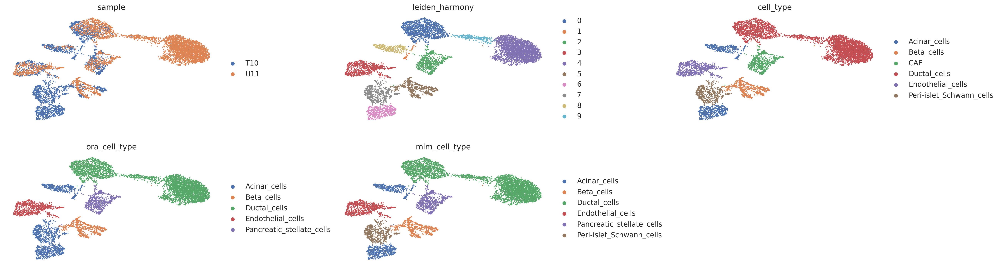

In [395]:
sc.pl.umap(adata, color=['sample',clustering_group,'cell_type','ora_cell_type','mlm_cell_type'], ncols=3, wspace=0.4)

# CONCLUSION

This concludes the introduction to single cell RNA-seq in python.
Thank you for join today.

I will share with me my email so you can ask and discuss with me and with the people that joined today about the fascinating, uncertain and sometime stressing world of sequencing analysis.

Some references:

[SCANPY](https://scanpy.readthedocs.io/en/stable/index.html)

[DECOUPLER](https://decoupler-py.readthedocs.io/en/latest/index.html)

[CELLxGENE](https://cellxgene.cziscience.com/)

[HPA](https://www.proteinatlas.org/)

[SC BEST PRACTICES](https://www.sc-best-practices.org/preamble.html)

[ANNDATA](https://anndata.readthedocs.io/en/latest/index.html)